## Methods for Smoothing/Blurring

**- Gamma Correction**
- applied to image to make it appear brighter or darker depending on the Gamma value chosen
 
 
**- Kernal Based filters**

- applied over an image to produce a varitey of effects
- An image kernel is a small matrix used to apply effects like the ones you might find in Photoshop or Gimp, such as blurring, sharpening, outlining or embossing. They're also used in machine learning for 'feature extraction', a technique for determining the most important portions of an image. In this context the process is referred to more generally as "convolution"


**- Types of kernels**: blur, bottom sobel, emboss, identity, left sobel, outline, right sobel, sharpen, top sobel

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# function read data
def load_img():
    img = cv2.imread(r'C:\Users\Data\computer vision\bricks.jpg').astype(np.float32)/255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# function show image
def show_pic(img):
    fix = plt.figure(figsize=(15,15))
    ax = fix.add_subplot(111)
    ax.imshow(img)

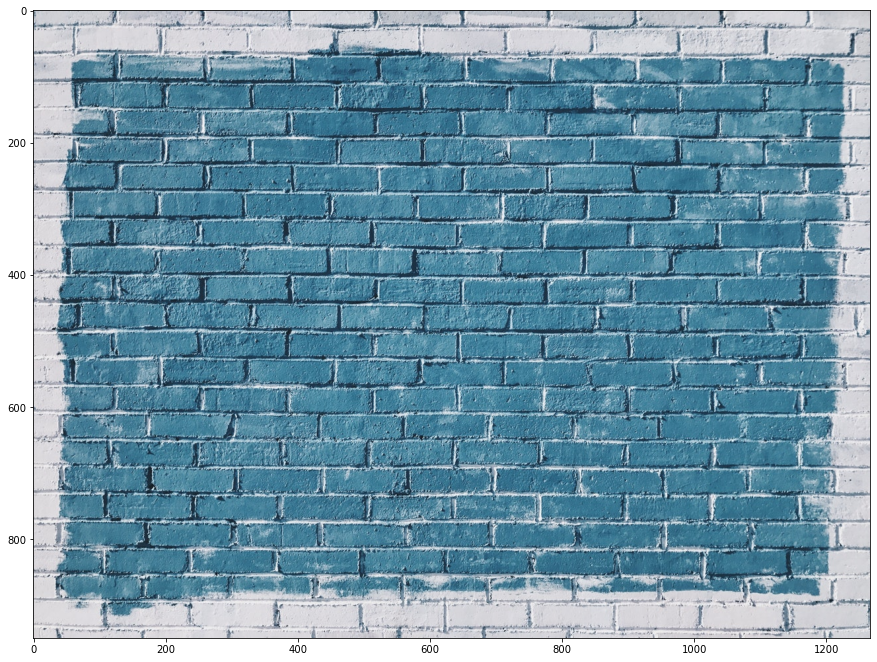

In [4]:
i = load_img()
show_pic(i)

## Brighter Image -lebih cerah
## gamma

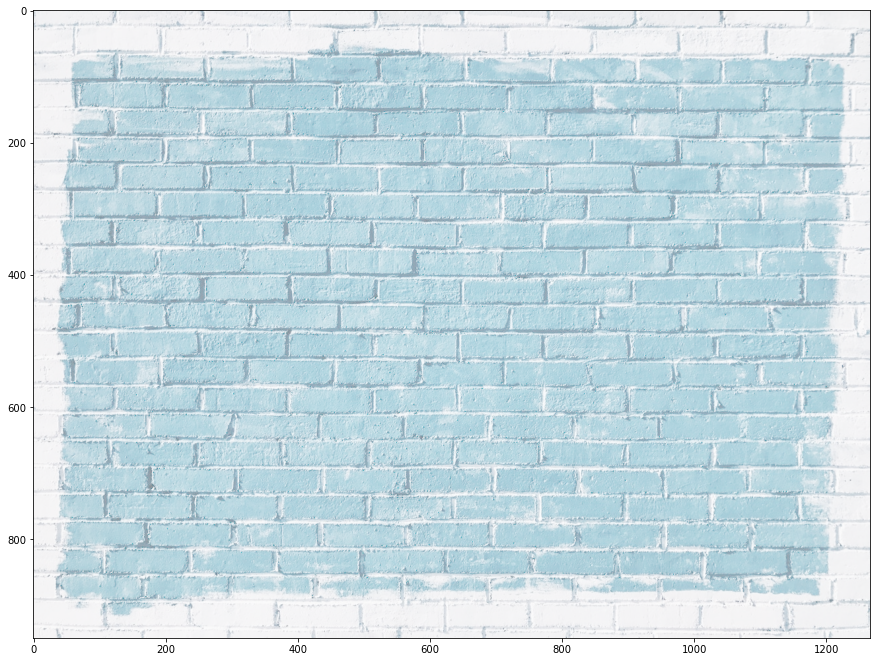

In [5]:
gamma = 1/4 # <1

result = np.power(i, gamma) # take every pixel of image and raise the values of each pixel by gamma
show_pic(result)

## Drark brigh

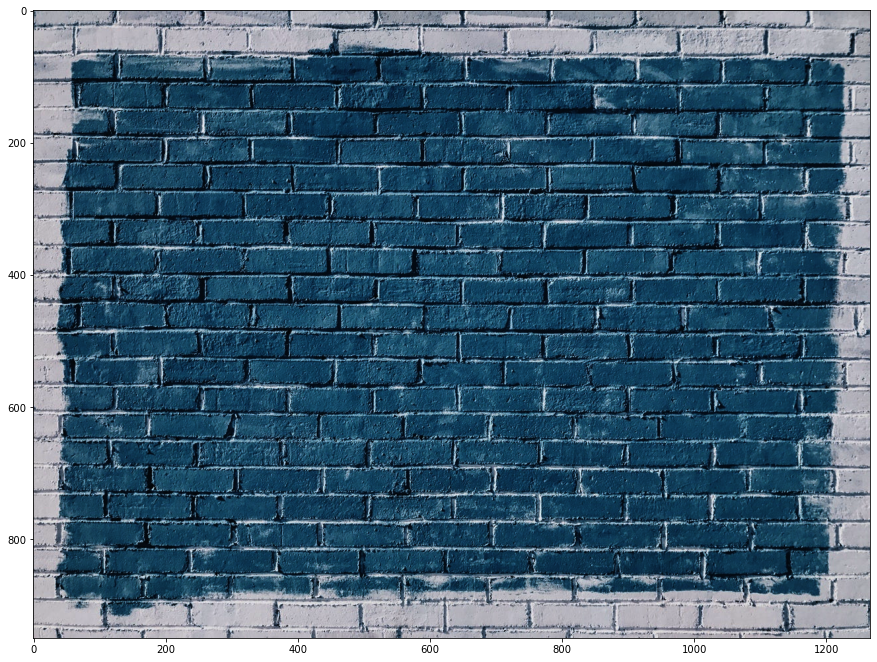

In [7]:
gamma = 2

result = np.power(i, gamma)
show_pic(result)

# Bluring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


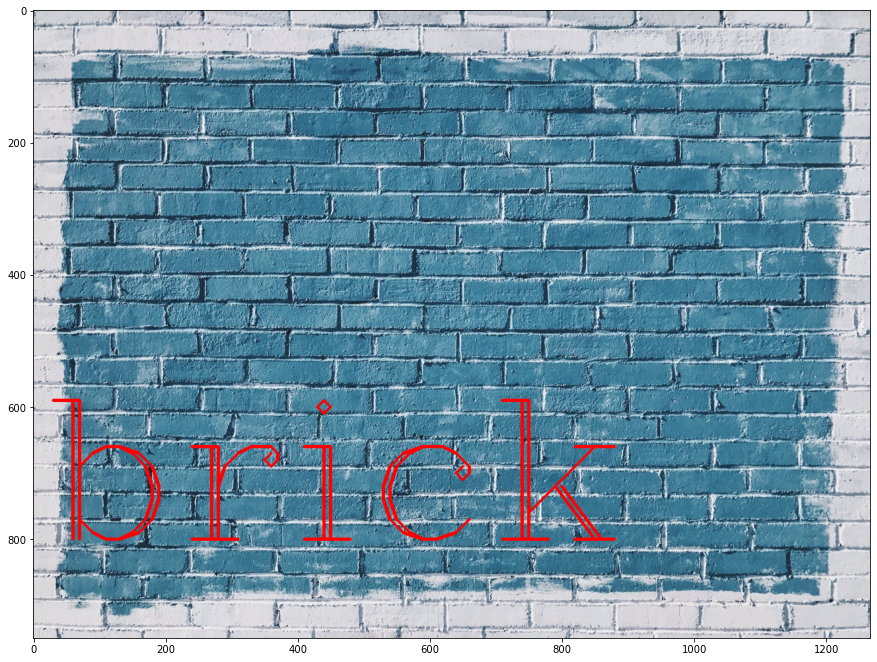

In [14]:
img = load_img()

cv2.putText(img, 'brick', (10, 800), cv2.FONT_HERSHEY_COMPLEX, 10, (255, 0,0), 3)
show_pic(img)

## Kernel

In [16]:
kernel = np.ones(shape=(5,5), dtype= np.float32)/25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [18]:
help(cv2.filter2D)

Help on built-in function filter2D:

filter2D(...)
    filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]]) -> dst
    .   @brief Convolves an image with the kernel.
    .   
    .   The function applies an arbitrary linear filter to an image. In-place operation is supported. When
    .   the aperture is partially outside the image, the function interpolates outlier pixel values
    .   according to the specified border mode.
    .   
    .   The function does actually compute correlation, not the convolution:
    .   
    .   \f[\texttt{dst} (x,y) =  \sum _{ \substack{0\leq x' < \texttt{kernel.cols}\\{0\leq y' < \texttt{kernel.rows}}}}  \texttt{kernel} (x',y')* \texttt{src} (x+x'- \texttt{anchor.x} ,y+y'- \texttt{anchor.y} )\f]
    .   
    .   That is, the kernel is not mirrored around the anchor point. If you need a real convolution, flip
    .   the kernel using #flip and set the new anchor to `(kernel.cols - anchor.x - 1, kernel.rows -
    .   anchor.y - 1)`.
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


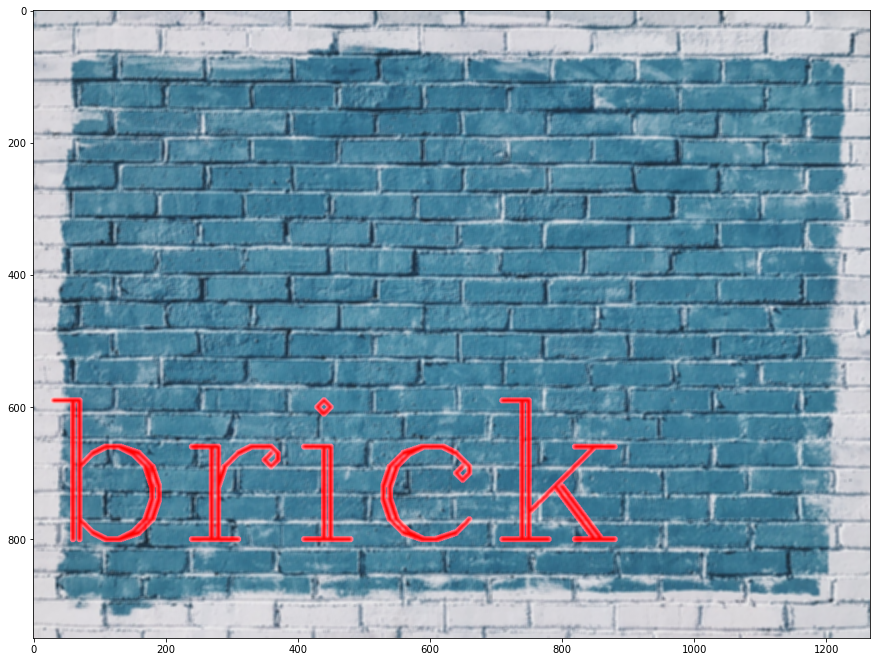

In [19]:
# apply 2D filter

dst = cv2.filter2D(img, -1, kernel) # -1 means assign input as desired output
show_pic(dst)

## Blur

In [26]:
img = load_img()

cv2.putText(img, 'Blur...!!!', (10, 400), cv2.FONT_HERSHEY_SIMPLEX, 8, (10, 255,255), 10)
print('Reset')

Reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


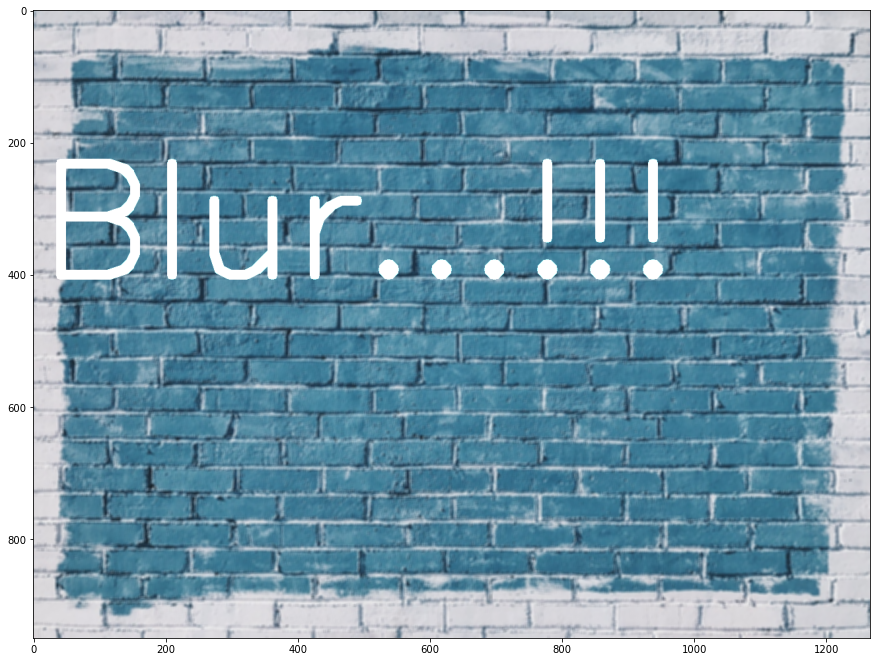

In [27]:
blur = cv2.blur(img, ksize = (5,5))
show_pic(blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


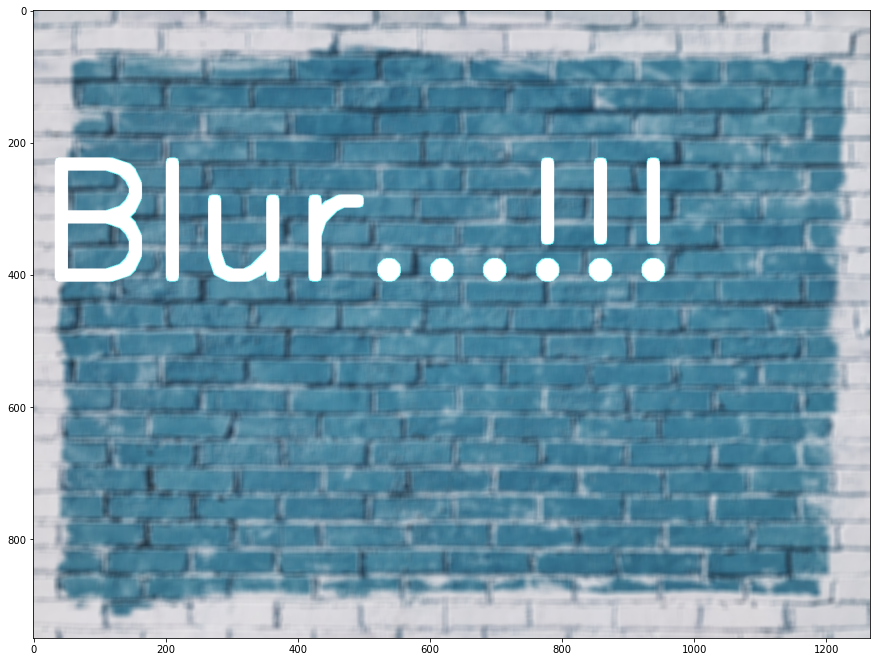

In [28]:
blur2 = cv2.blur(img, ksize=(10, 10))
show_pic(blur2)

## Gausian Bluring

In [40]:
img = load_img()

cv2.putText(img, 'Gausian Bluring',(20, 600), cv2.FONT_HERSHEY_COMPLEX, 4, (255, 255, 0), 10)
print('Reset')

Reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


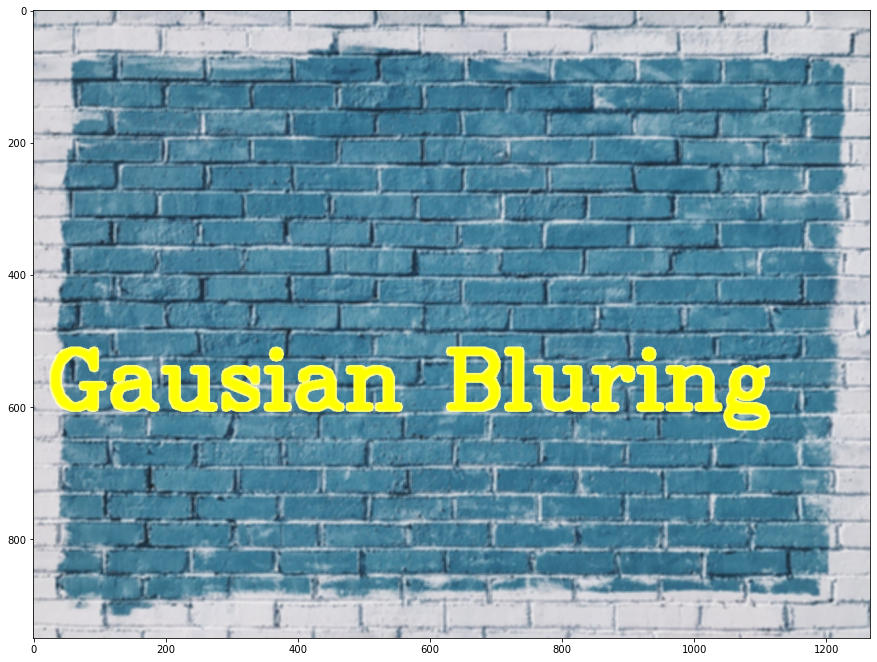

In [41]:
blur = cv2.GaussianBlur(img, (5,5), sigmaX = 10)
show_pic(blur)

## Median Blur

In [54]:
img = load_img()

cv2.putText(img, ('Median Blur'), (200, 800), cv2.FONT_HERSHEY_SIMPLEX, 5, (10, 255, 255), 4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


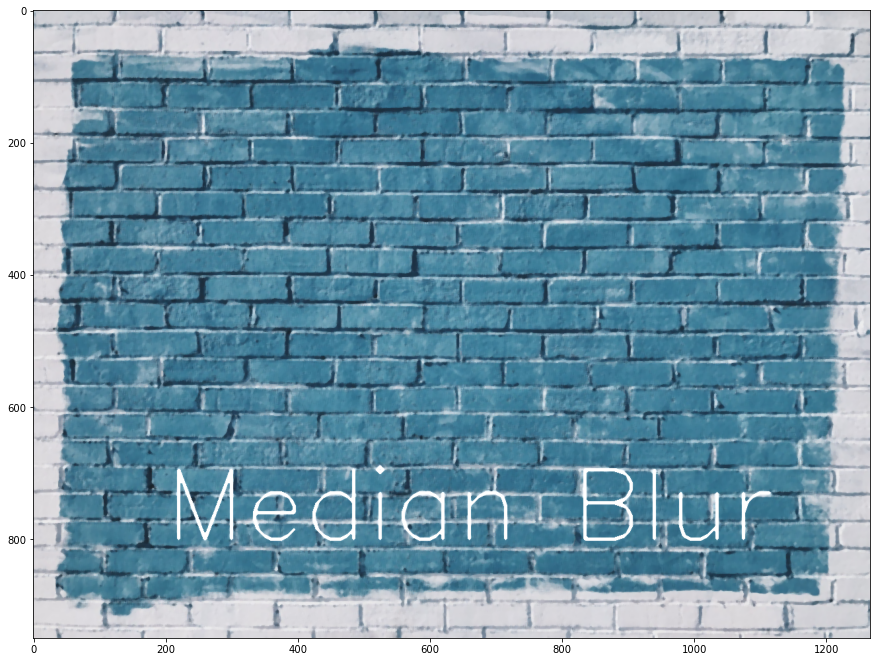

In [55]:
blur = cv2.medianBlur(img, 5)
show_pic(blur)

## O Real world application

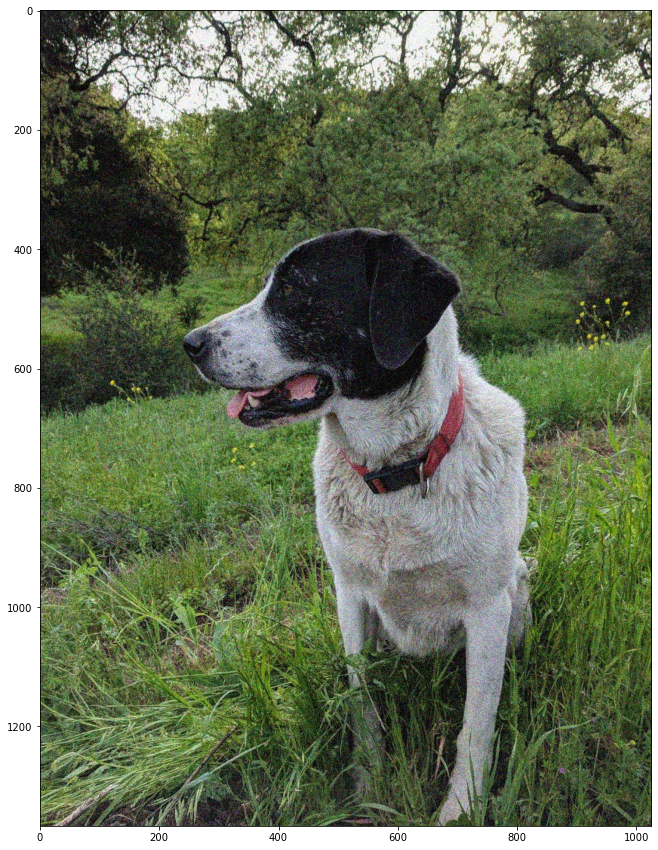

In [56]:
img_noise_dog = cv2.imread(r'C:\Users\Data\computer vision\sammy_noise.jpg')

show_pic(img_noise_dog)

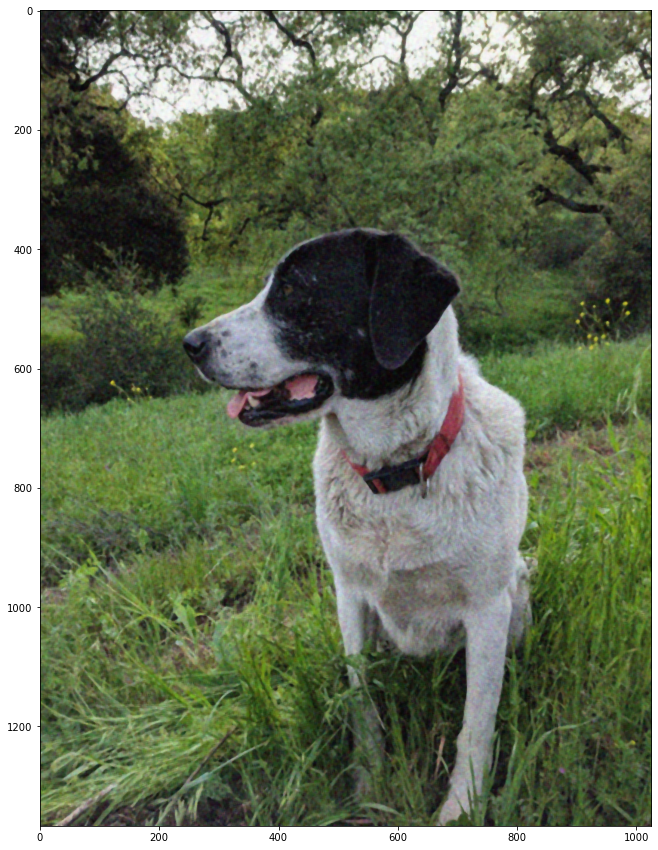

In [57]:
median = cv2.medianBlur(img_noise_dog, 5)
show_pic(median)

## Bilateral Filtering

In [60]:
img = load_img()

cv2.putText(img, 'Bilateral Filtering', (40, 430), cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 0,0), 5)
print('Reset')

Reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


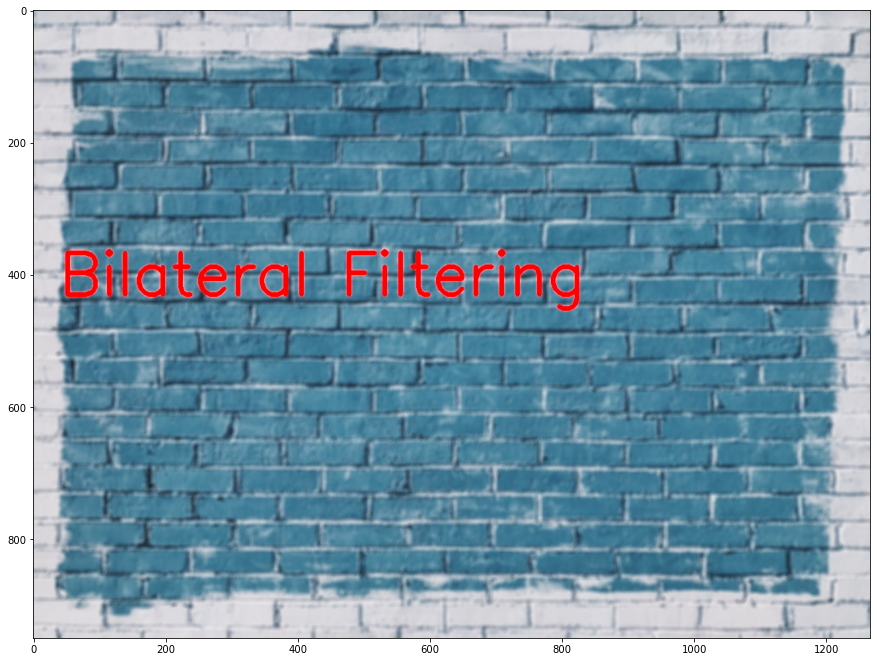

In [61]:
blur = cv2.bilateralFilter(img, 9,75, 75)

show_pic(blur)

In [63]:
help(cv2.bilateralFilter)

Help on built-in function bilateralFilter:

bilateralFilter(...)
    bilateralFilter(src, d, sigmaColor, sigmaSpace[, dst[, borderType]]) -> dst
    .   @brief Applies the bilateral filter to an image.
    .   
    .   The function applies bilateral filtering to the input image, as described in
    .   http://www.dai.ed.ac.uk/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html
    .   bilateralFilter can reduce unwanted noise very well while keeping edges fairly sharp. However, it is
    .   very slow compared to most filters.
    .   
    .   _Sigma values_: For simplicity, you can set the 2 sigma values to be the same. If they are small (\<
    .   10), the filter will not have much effect, whereas if they are large (\> 150), they will have a very
    .   strong effect, making the image look "cartoonish".
    .   
    .   _Filter size_: Large filters (d \> 5) are very slow, so it is recommended to use d=5 for real-time
    .   applications, and perhaps d=9 for offline applicatio